# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Fixed-variances" data-toc-modified-id="Fixed-variances-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Fixed variances</a></div><div class="lev1 toc-item"><a href="#Sum-of-products,-freed-variances" data-toc-modified-id="Sum-of-products,-freed-variances-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Sum of products, freed variances</a></div><div class="lev1 toc-item"><a href="#Sum-of-products,-all-parameters-free" data-toc-modified-id="Sum-of-products,-all-parameters-free-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Sum of products, all parameters free</a></div><div class="lev1 toc-item"><a href="#STAN-Imputations" data-toc-modified-id="STAN-Imputations-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>STAN Imputations</a></div><div class="lev1 toc-item"><a href="#Aggregating--imputation-MSE-over-all-windows" data-toc-modified-id="Aggregating--imputation-MSE-over-all-windows-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Aggregating  imputation MSE over all windows</a></div><div class="lev1 toc-item"><a href="#Aggregating-nearby-pred-diagnostics" data-toc-modified-id="Aggregating-nearby-pred-diagnostics-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Aggregating nearby-pred diagnostics</a></div>

In [2]:
const SAVED_DIR = "/Volumes/Samsung250GB/temperature_model/saved"

"/Volumes/Samsung250GB/temperature_model/saved"

In [1]:
using TimeSeries
using DataFrames
using GaussianProcesses
using GaussianProcesses: Mean, Kernel, evaluate, metric, IsotropicData, VecF64
using GaussianProcesses: Stationary, KernelData, MatF64, predict
import GaussianProcesses: optimize!, get_optim_target, cov, grad_slice!
import GaussianProcesses: num_params, set_params!, get_params, update_mll!, update_mll_and_dmll!
import GaussianProcesses: get_param_names, cov!, addcov!, multcov!
import Proj4
import Mamba
using JLD
using Distances
using DataFrames: by, head
using Dates: tonext, Hour, Day

INFO: Recompiling stale cache file /Users/imolk/.julia/lib/v0.5/FixedPointNumbers.ji for module FixedPointNumbers.
INFO: Recompiling stale cache file /Users/imolk/.julia/lib/v0.5/ColorTypes.ji for module ColorTypes.
INFO: Recompiling stale cache file /Users/imolk/.julia/lib/v0.5/Compose.ji for module Compose.
INFO: Recompiling stale cache file /Users/imolk/.julia/lib/v0.5/Gadfly.ji for module Gadfly.
INFO: Precompiling module Graphs.


In [3]:
include("src/TempModel.jl")

TempModel

In [106]:
import PyPlot; plt=PyPlot
using LaTeXStrings
plt.rc("figure", dpi=300.0)
plt.rc("figure", figsize=(12,8))
plt.rc("savefig", dpi=300.0)
plt.rc("text", usetex=false)
plt.rc("font", family="serif")
plt.rc("font", serif="Palatino")
;

In [5]:
isdList=TempModel.read_isdList()
isdSubset=isdList[[(usaf in (725450,725460,725480,725485)) for usaf in isdList[:USAF].values],:]
isdSubset

,USAF,WBAN,NAME,CTRY,STATE,ICAO,LAT,LON,ELEV,BEGIN,END,X_PRJ,Y_PRJ
1,725450,14990,THE EASTERN IOWA AIRPORT,US,IA,KCID,41.883,-91.717,264.6,1973,2015,1.64799e6,1.0441e6
2,725460,14933,DES MOINES INTERNATIONAL AIRPORT,US,IA,KDSM,41.534,-93.653,291.7,1973,2015,1.48723e6,1.00379e6
3,725480,94910,WATERLOO MUNICIPAL AIRPORT,US,IA,KALO,42.554,-92.401,264.6,1960,2015,1.59025e6,1.11766e6
4,725485,14940,MASON CITY MUNICIPAL ARPT,US,IA,KMCW,43.154,-93.327,373.4,1973,2015,1.51407e6,1.18374e6


In [6]:
hourly_cat=TempModel.read_Stations(isdSubset)
itest=3
hourly_train = hourly_cat[hourly_cat[:station].values.!=itest,:]
hourly_test  = hourly_cat[hourly_cat[:station].values.==itest,:]
nrow(hourly_train), nrow(hourly_test)
test_usaf=get(isdSubset[itest,:USAF])

725480

In [7]:
hr_measure = Hour(17) # number between 0 and 24
hourly_test[:ts_day] = [TempModel.measurement_date(t, hr_measure) for t in hourly_test[:ts].values]
TnTx = DataFrames.by(hourly_test, :ts_day, df -> DataFrame(
    Tn=minimum(df[:temp].values), 
    Tx=maximum(df[:temp].values)))
test_trimmed=join(hourly_test, TnTx, on=:ts_day)
head(test_trimmed)

,year,month,day,hour,min,seconds,temp,ts,station,ts_hours,ts_day,Tn,Tx
1,2015,1,1,0,0,0,-8.3,2015-01-01T00:00:00,3,0.0,2015-01-01,-11.1,-3.9
2,2015,1,1,0,54,0,-8.9,2015-01-01T00:54:00,3,0.9,2015-01-01,-11.1,-3.9
3,2015,1,1,1,54,0,-8.9,2015-01-01T01:54:00,3,1.9,2015-01-01,-11.1,-3.9
4,2015,1,1,2,54,0,-9.4,2015-01-01T02:54:00,3,2.9,2015-01-01,-11.1,-3.9
5,2015,1,1,3,54,0,-9.4,2015-01-01T03:54:00,3,3.9,2015-01-01,-11.1,-3.9
6,2015,1,1,4,54,0,-10.0,2015-01-01T04:54:00,3,4.9,2015-01-01,-11.1,-3.9


In [8]:
function subset(df, from, to; closed_start=true, closed_end=true)
    ts = df[:ts].values
    return df[argsubset(ts,from,to;closed_start=closed_start,closed_end=closed_end),:]
end
function argsubset(ts, from, to; closed_start=true, closed_end=true)
    if closed_start
        after_from = ts .>= from
    else
        after_from = ts .> from
    end
    if closed_end
        before_to = ts .<= to
    else
        before_to = ts .< to
    end
    return after_from & before_to
end

argsubset (generic function with 1 method)

In [9]:
function add_diag!(Σ::PDMats.PDMat, a::Float64)
    mat = Σ.mat
    for i in 1:size(mat,1)
        mat[i,i] += a
    end
    copy!(Σ.chol.factors, mat)
    cholfact!(Σ.chol.factors, Symbol(Σ.chol.uplo))
    @assert sumabs(mat .- full(Σ.chol)) < 1e-8
    return Σ
end
;

In [10]:
type FittingWindow
    start_date::Date
    end_date::Date
end

In [11]:
function predictions_fname(usaf::Int, fw::FittingWindow)
    return @sprintf("%d_%s_to_%s.jld", 
                    usaf, fw.start_date, fw.end_date)
end

function get_nearby(fw::FittingWindow, GPmodel::AbstractString)
    saved_dir = joinpath(SAVED_DIR, "predictions_from_nearby", GPmodel)
    pred_fname = predictions_fname(test_usaf, fw)
    nearby_pred=load(joinpath(saved_dir, pred_fname))["nearby_pred"]
end

get_nearby (generic function with 1 method)

In [12]:
function plot_predictive(nearby_pred::TempModel.NearbyPrediction, xlim::Tuple{DateTime,DateTime})
    test_subset = subset(test_trimmed, xlim[1], xlim[2])
    train_subset = subset(hourly_train, xlim[1], xlim[2])
    μ = nearby_pred.μ
    Σ = nearby_pred.Σ
    nobsv = length(μ)
    
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ.mat * centering
    distr = MultivariateNormal(μ, Σ)
    for station in unique(train_subset[:station].values)
        sdata = train_subset[train_subset[:station].values.==station,:]
        ts=sdata[:ts].values
        plt.plot(ts, sdata[:temp].values.-mean(sdata[:temp].values), color="#F8A21F", 
            label="records at"get(isdSubset[station,:NAME]))
    end
    _ylim = plt.ylim()
    ts=nearby_pred.ts
    plt.plot(ts, μ, color="#009F77", linewidth=2, label="posterior mean")
    for _ in 1:2
        temp_sim = rand(distr)
        plt.plot(ts, temp_sim.-mean(temp_sim), color="#009F77", linewidth=1)
    end
    plt.fill_between(ts, μ-2*√diag(Σ_centered),μ+2*√diag(Σ_centered), color="#009F77", alpha=0.3)
    ts = test_subset[:ts].values
    temp_true = test_subset[:temp].values
    plt.plot(ts, temp_true.-mean(temp_true), 
        color="black", "-", label="true hourly")
    plt.legend(loc="best")
    plt.title("Predictive distribution based on nearby data alone")
    plt.xlim(xlim)
    plt.ylim(_ylim)
end
;

In [13]:
function print_diagnostics(nearby::TempModel.NearbyPrediction; ndraws=10000)
    ts = nearby.ts
    ts_start = minimum(ts)
    ts_end = maximum(ts)
    test_subset = subset(test_trimmed, ts_start, ts_end)
    train_subset = subset(hourly_train, ts_start, ts_end)

    μ = nearby.μ
    Σ = nearby.Σ
    nobsv = length(μ)
    
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ.mat * centering
    distr = MultivariateNormal(μ, Σ)
#     println("sum(Σ_centered)=", sum(Σ_centered*Σ_centered))
    for _ in 1:5
        temp_sim = rand(distr)
        println("var(predicted mean - simulated prediction)=", var(μ .- temp_sim))
    end
    temp_true = test_subset[:temp].values
    println("E(var(predicted mean - predictive draw))=", mean(var(μ .- rand(distr)) for _ in 1:ndraws))
    println("var(truth - predicted mean)=", var(μ .- temp_true))
end

print_diagnostics (generic function with 1 method)

In [14]:
function plot_residuals(nearby::TempModel.NearbyPrediction)
    ts = nearby.ts
    ts_start = minimum(ts)
    ts_end = maximum(ts)
    test_subset = subset(test_trimmed, ts_start, ts_end)

    μ = nearby_pred.μ
    Σ = nearby_pred.Σ
    nobsv = length(μ)
    
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ.mat * centering
    distr = MultivariateNormal(μ, Σ)
    temp_true = test_subset[:temp].values
    println("var(truth - predicted mean)=", var(μ .- temp_true))
    residuals = μ .- temp_true
    plt.plot(ts, abs(residuals .- mean(residuals)))
    plt.ylabel("Absolute residuals")
end

plot_residuals (generic function with 1 method)

# Fixed variances

In [15]:
test_fw = FittingWindow(Date(2015,4,8),Date(2015,6,20))

FittingWindow(2015-04-08,2015-06-20)

In [16]:
GPmodel="fixed_var"

"fixed_var"

In [22]:
nearby_pred = get_nearby(test_fw, GPmodel);

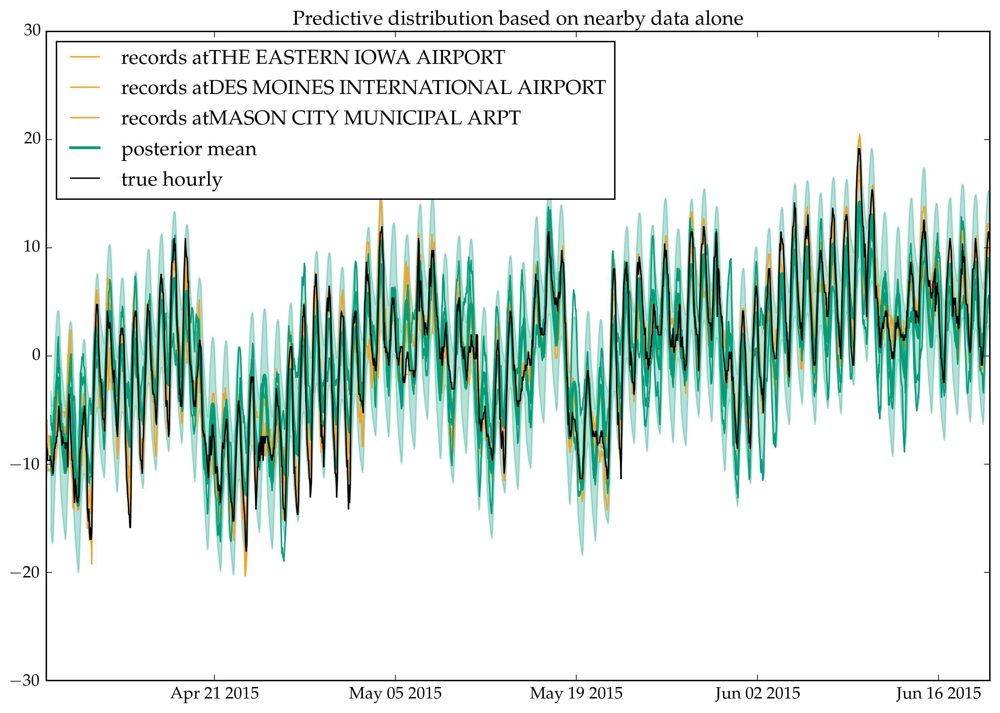

(-30.0,30.0)

In [23]:
plot_predictive(nearby_pred, (DateTime(test_fw.start_date), DateTime(test_fw.end_date)))

In [24]:
print_diagnostics(nearby_pred; ndraws=100)

var(predicted mean - simulated prediction)=10.323182023443657
var(predicted mean - simulated prediction)=9.71142319624179
var(predicted mean - simulated prediction)=10.676800213418884
var(predicted mean - simulated prediction)=8.53502465796271
var(predicted mean - simulated prediction)=15.24705206357956
E(var(predicted mean - predictive draw))=9.511230981809907
var(truth - predicted mean)=6.090607796619108


var(truth - predicted mean)=6

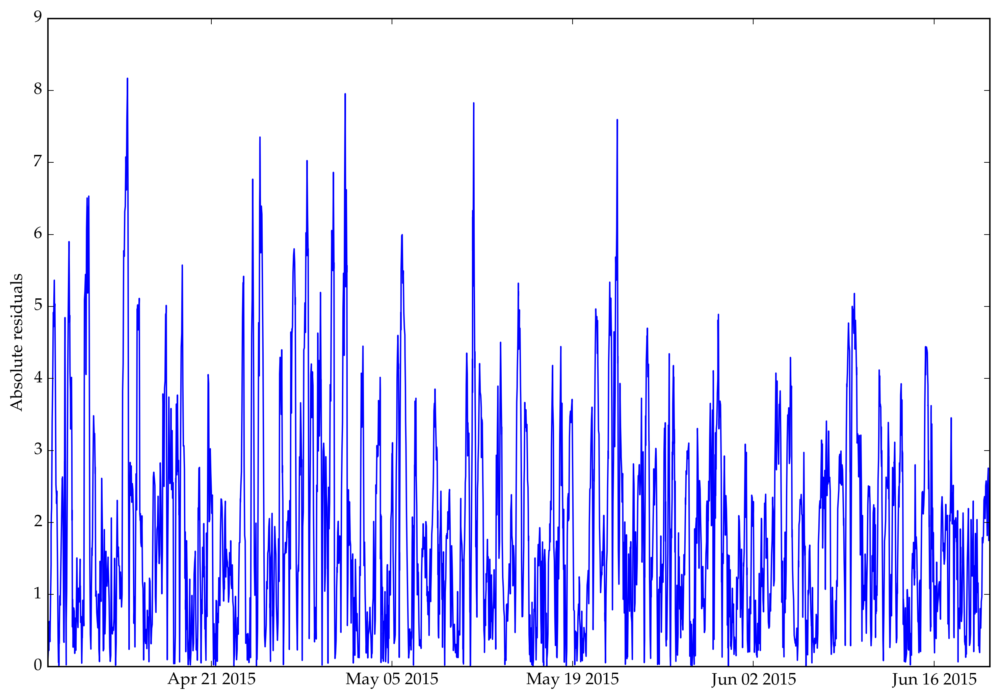

.090607796619108


PyObject <matplotlib.text.Text object at 0x342b82890>

In [25]:
plot_residuals(nearby_pred)

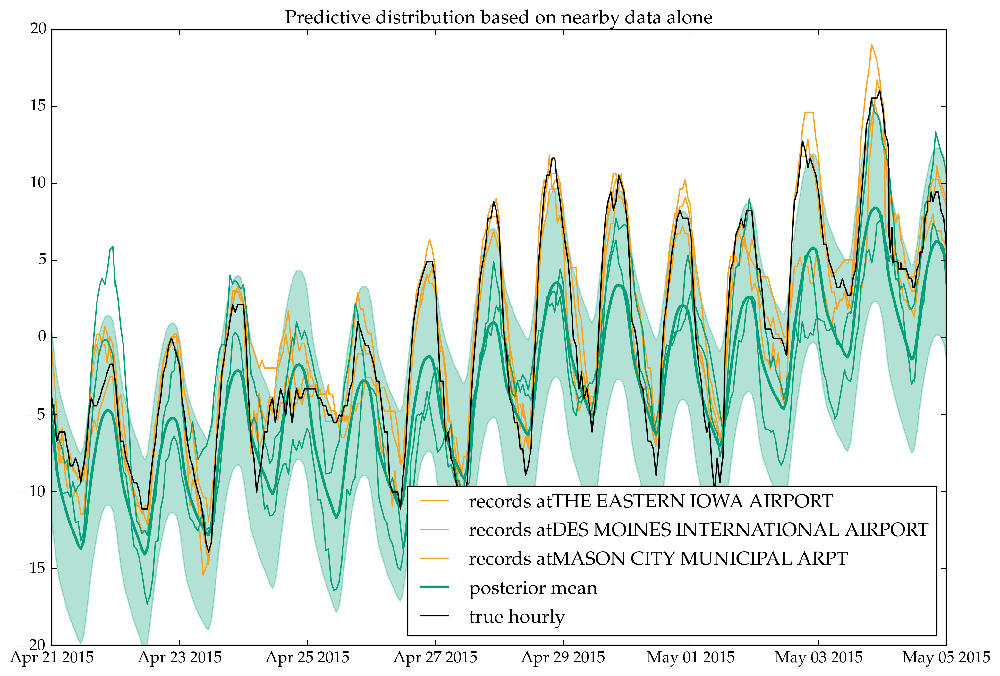

(-20.0,20.0)

In [26]:
plot_predictive(nearby_pred, (DateTime(2015,4,21),DateTime(2015,5,5)))

# Sum of products, freed variances

In [27]:
GPmodel = "free_var"

"free_var"

In [28]:
nearby_pred = get_nearby(test_fw, GPmodel);

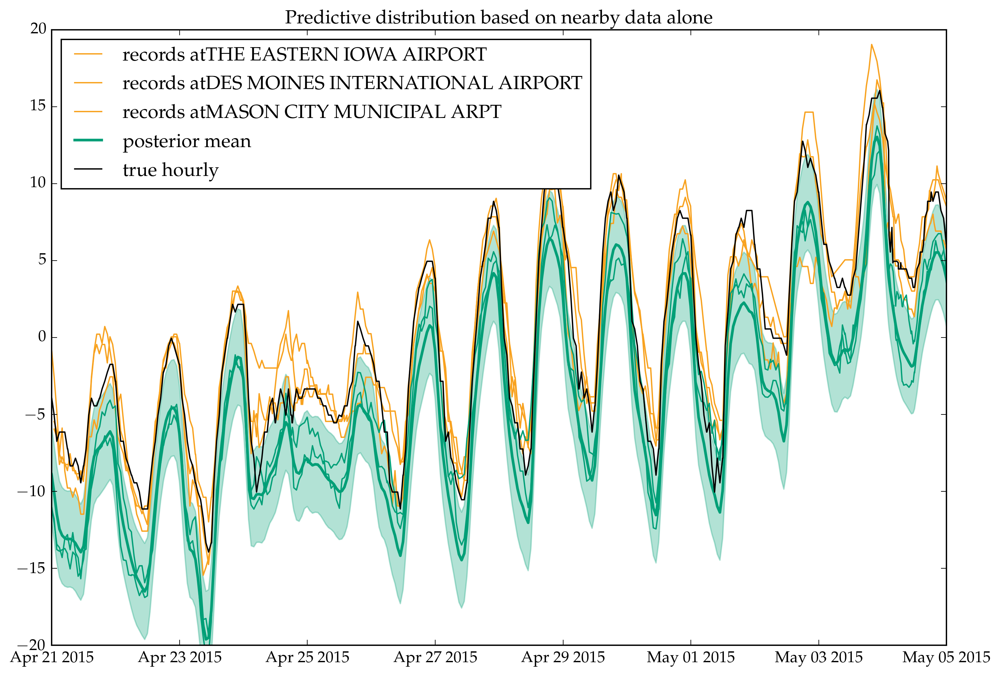

(-20.0,20.0)

In [29]:
plot_predictive(nearby_pred, (DateTime(2015,4,21),DateTime(2015,5,5)))

In [30]:
@time print_diagnostics(nearby_pred; ndraws=100)

var(predicted mean - simulated prediction)=2.1537436334088014
var(predicted mean - simulated prediction)=2.756467626247685
var(predicted mean - simulated prediction)=2.0472222747233357
var(predicted mean - simulated prediction)=2.747218951866495
var(predicted mean - simulated prediction)=2.4257706610453416
E(var(predicted mean - predictive draw))=2.4129254987609605
var(truth - predicted mean)=1.2494531076575177
  1.073289 seconds (10.45 k allocations: 312.260 MB, 14.62% gc time)


# Sum of products, all parameters free

In [31]:
GPmodel = "sumprod"

"sumprod"

In [32]:
nearby_pred = get_nearby(test_fw, GPmodel);

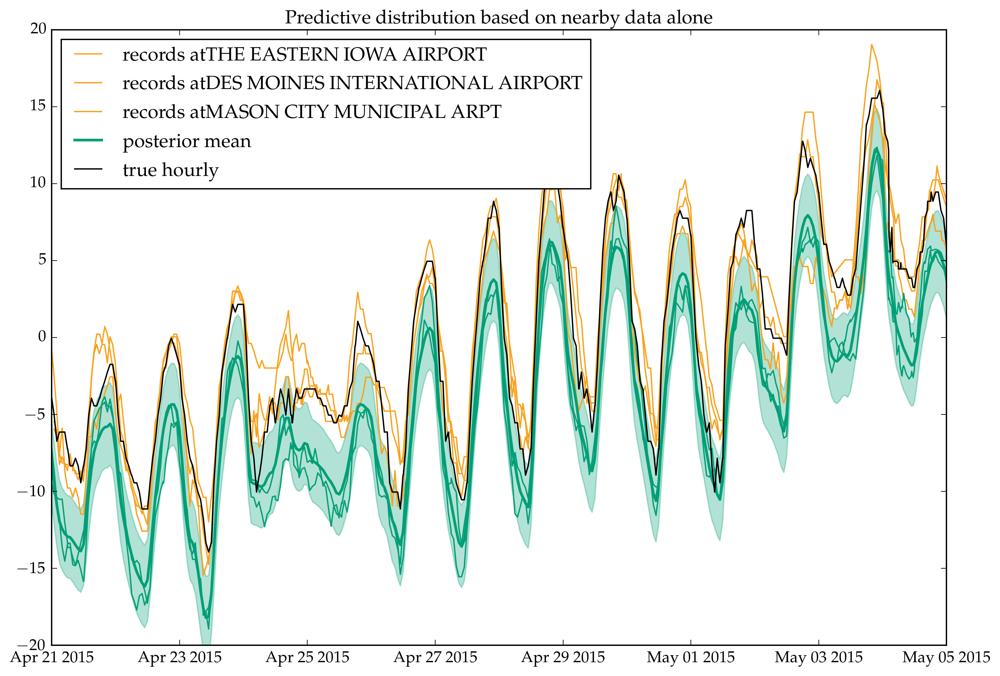

(-20.0,20.0)

In [33]:
plot_predictive(nearby_pred, (DateTime(2015,4,21),DateTime(2015,5,5)))

In [34]:
@time print_diagnostics(nearby_pred; ndraws=100)

var(predicted mean - simulated prediction)=1.8476760839477404
var(predicted mean - simulated prediction)=1.7083722193155146
var(predicted mean - simulated prediction)=1.693350646569176
var(predicted mean - simulated prediction)=1.8138339695870227
var(predicted mean - simulated prediction)=1.620634448337353
E(var(predicted mean - predictive draw))=1.7825649998489101
var(truth - predicted mean)=1.3771718160277167
  1.142028 seconds (10.36 k allocations: 312.254 MB, 14.76% gc time)


Annoyingly, we again see that even though this model has more free parameters, and the marginal likelihood was significantly lower (when we optimized all the parameters), the predictive variance is actually worse (higher).

# STAN Imputations

In [35]:
function stan_dirname(usaf::Int, fw::FittingWindow)
    return @sprintf("%d_%s_to_%s/", 
                    usaf, fw.start_date, fw.end_date)
end

stan_dirname (generic function with 1 method)

In [36]:
stan_increment = Day(3)
stan_days = Day(9)
janfirst = Date(2015,1,1)
;

In [37]:
function get_test_fw(test::DataFrame, fw::FittingWindow)
    window_start = DateTime(fw.start_date) + hr_measure
    window_end = DateTime(fw.end_date) + hr_measure
    return subset(test, window_start, window_end; closed_start=false)
end
function arg_test_fw(test::DataFrame, fw::FittingWindow)
    window_start = DateTime(fw.start_date) + hr_measure
    window_end = DateTime(fw.end_date) + hr_measure
    return argsubset(test[:ts].values, window_start, window_end; closed_start=false)
end
function get_window(windownum::Int)
    stan_start = janfirst + (windownum-1)*stan_increment
    stan_end = stan_start + stan_days
    stan_fw = FittingWindow(stan_start, stan_end)
    return stan_fw
end
function window_center(fw::FittingWindow, increment::Day)
    # this doesn't generalize
    return FittingWindow(fw.start_date+increment,fw.end_date-increment)
end

window_center (generic function with 1 method)

In [38]:
function get_chains(fw::FittingWindow, GPmodel::AbstractString)
    stan_fw_dir = stan_dirname(test_usaf, fw)
    stan_model_dir = joinpath(SAVED_DIR, "stan_fit", GPmodel)
    stan_window_files = readdir(joinpath(stan_model_dir, stan_fw_dir))
    samplefiles = [joinpath(stan_model_dir, stan_fw_dir, f) for 
        f in stan_window_files if 
        endswith(f,".csv")]
    global header
    all_samples=[]
    for sf in samplefiles
        samples, header = readcsv(sf, Float64; header=true)
        push!(all_samples, samples)
    end

    samples = cat(3, all_samples...)
    chains = Mamba.Chains(samples; start=1, thin=1, chains=[i for i in 1:4], names=vec(header))
    return chains
end

get_chains (generic function with 1 method)

In [39]:
# convenience function to extract the imputed temperatures
# from the Mamba Chains object
function get_temperatures_reparam(chains::Mamba.Chains)
    temp_varnames = [h for h in chains.names if startswith(h, "temp_impt.")]
    temp_samples=getindex(chains, :, temp_varnames, :).value
    return temp_samples
end

get_temperatures_reparam (generic function with 1 method)

In [40]:
function get_temp_percentiles(temp_impute)
    stacked_impute=vcat((temp_impute[:,:,i] for i in 1:size(temp_impute,3))...)
    sorted_impute = sort(stacked_impute,1);
    nsamples=size(sorted_impute,1)
    # extract  10th and 90th percentiles
    # of the imputations
    imputed_10 = sorted_impute[div(nsamples,10), :]
    imputed_90 = sorted_impute[nsamples-div(nsamples,10), :]
    return imputed_10, imputed_90
end
function get_temp_mean(temp_impute)
    stacked_impute=vcat((temp_impute[:,:,i] for i in 1:size(temp_impute,3))...)
    μ = vec(mean(stacked_impute, 1))
    return μ
end

get_temp_mean (generic function with 1 method)

In [41]:
function plot_imputations(ts, temp_impute)
    imputed_10, imputed_90 = get_temp_percentiles(temp_impute)
    μ = get_temp_mean(temp_impute)
    
    plt.fill_between(ts, imputed_10, imputed_90, 
        color="#F16424", alpha=0.5, label=L"$80\%$ credible interval")
    plt.plot(ts, temp_impute[250,:,1],
        color="#009F77", label="single imputation")
    plt.plot(ts, μ, color="#F16424", linewidth=3, label="posterior mean")
end
function plot_truth(test::DataFrame)
    ts = test[:ts].values
    plt.plot(ts, test[:temp].values, 
        color="black", "o-", label="true hourly")
    plt.plot(ts, test_subsubset[:Tn].values, 
        color="blue", linewidth=3, label=L"$T_n$")
    plt.plot(ts, test_subsubset[:Tx].values, 
        color="red", linewidth=3, label=L"$T_x$")
end

plot_truth (generic function with 1 method)

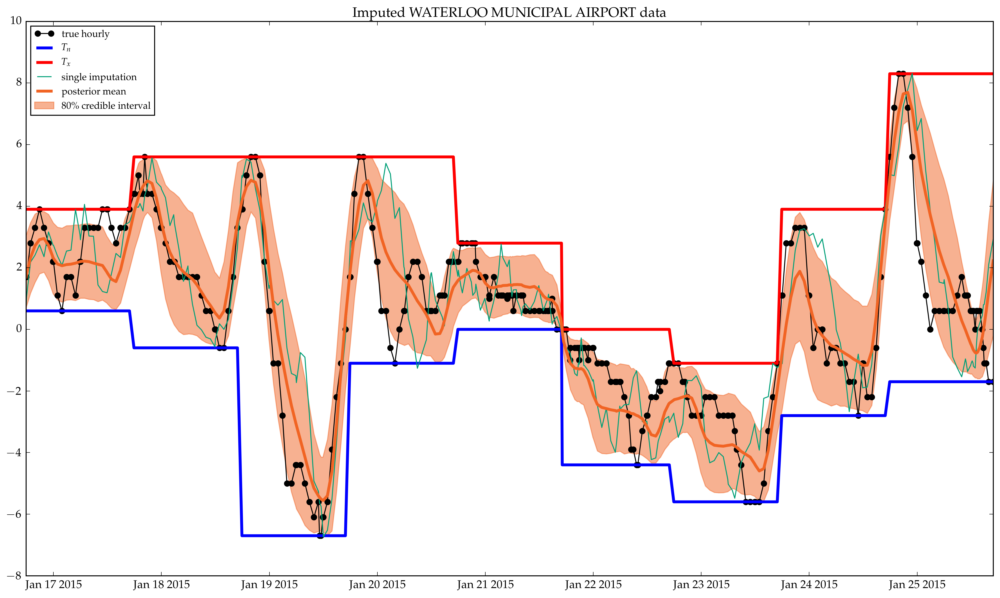

In [42]:
GPModel = "fixed_var"
window_num = 6
stan_fw = get_window(window_num)
chains = get_chains(stan_fw, GPModel)
temp_impute = get_temperatures_reparam(chains)
test_subsubset = get_test_fw(test_trimmed, stan_fw)

plot_truth(test_subsubset)
plot_imputations(test_subsubset[:ts].values, temp_impute)

plt.legend(loc="best", fontsize="small")
plt.gcf()[:set_size_inches](18.0, 10.0)
plt.title(@sprintf("Imputed %s data", get(isdSubset[itest,:NAME])))
;

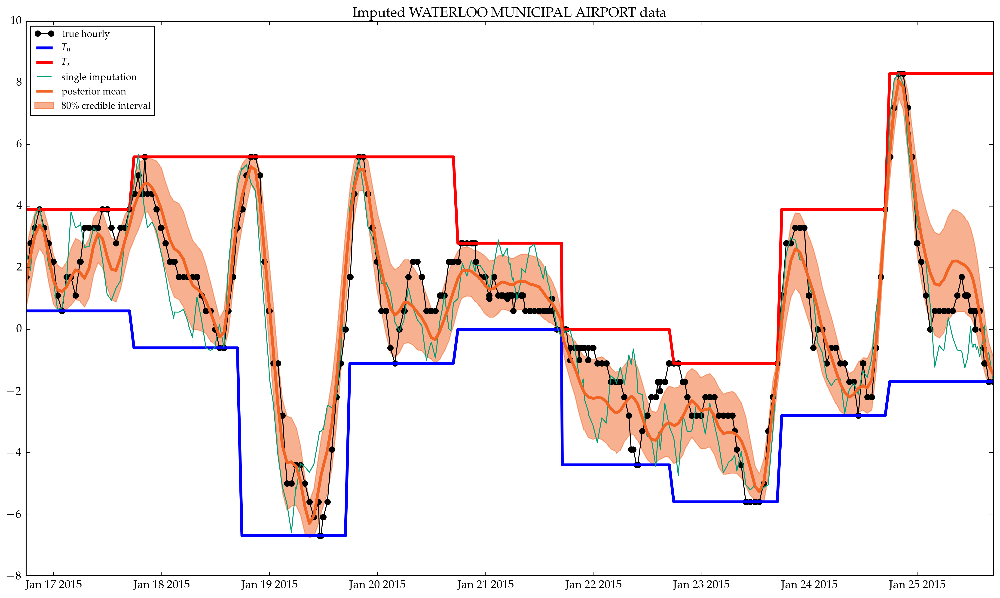

In [43]:
GPModel = "free_var"
window_num = 6
stan_fw = get_window(window_num)
chains = get_chains(stan_fw, GPModel)
temp_impute = get_temperatures_reparam(chains)
test_subsubset = get_test_fw(test_trimmed, stan_fw)

plot_truth(test_subsubset)
plot_imputations(test_subsubset[:ts].values, temp_impute)

plt.legend(loc="best", fontsize="small")
plt.gcf()[:set_size_inches](18.0, 10.0)
plt.title(@sprintf("Imputed %s data", get(isdSubset[itest,:NAME])))
;

In [44]:
mse(yhat::Vector,y::Vector) = mean((y.-yhat).^2)
verr(yhat::Vector,y::Vector) = var(y.-yhat)
type ImputationDiagnostic
    sumEVarError::Float64
    sumSE::Float64
    n::Int
end
EVarError(diag::ImputationDiagnostic) = diag.sumEVarError / diag.n
mse(diag::ImputationDiagnostic) = diag.sumSE / diag.n
function ImputationDiagnostic(temp_impute::Array{Float64,3}, test_truth::DataFrame)
    stacked_impute=vcat((temp_impute[:,:,i] for i in 1:size(temp_impute,3))...)
    temp_true = test_truth[:temp].values
    ts = test_subsubset[:ts].values
    μ = vec(mean(stacked_impute, 1))
    evar_err = mean(mse(μ, stacked_impute[i,:]) for i in 1:size(stacked_impute,1))
    MSE = mse(μ, temp_true)
    n = length(μ)
    return ImputationDiagnostic(evar_err*n, MSE*n, n)
end

ImputationDiagnostic

In [45]:
import Base.+
function +(diag1::ImputationDiagnostic,diag2::ImputationDiagnostic)
    return ImputationDiagnostic(
        diag1.sumEVarError + diag2.sumEVarError,
        diag1.sumSE + diag2.sumSE,
        diag1.n + diag2.n
        )
end

+ (generic function with 315 methods)

In [46]:
begin
    temp_impute = get_temperatures_reparam(chains)
    diag += ImputationDiagnostic(temp_impute, test_subsubset)
    @printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(diag))
    @printf("MSE(truth - predicted mean)=             %.5f\n", mse(diag))
end

LoadError: MethodError: no method matching +(::Base.LinAlg.#diag, ::ImputationDiagnostic)[0m
Closest candidates are:
  +(::Any, ::Any, [1m[31m::Any[0m, [1m[31m::Any...[0m) at operators.jl:138
  +([1m[31m::ImputationDiagnostic[0m, ::ImputationDiagnostic) at In[45]:3[0m

# Aggregating  imputation MSE over all windows

In [160]:
all_impt_diagn = Dict{String, Vector{ImputationDiagnostic}}()

Dict{String,Array{ImputationDiagnostic,1}} with 0 entries

In [164]:
GPModel = "SExSE"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains = get_chains(stan_fw, GPModel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=0.43677
MSE(truth - predicted mean)=             1.12880


In [165]:
GPModel = "diurnal"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains = get_chains(stan_fw, GPModel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=0.52135
MSE(truth - predicted mean)=             1.15052


In [166]:
GPModel = "fixed_var"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains = get_chains(stan_fw, GPModel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=2.42268
MSE(truth - predicted mean)=             2.98301


In [167]:
GPModel = "free_var"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains = get_chains(stan_fw, GPModel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=0.85504
MSE(truth - predicted mean)=             1.14113


In [168]:
GPModel = "sumprod"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains = get_chains(stan_fw, GPModel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=0.90776
MSE(truth - predicted mean)=             1.12587


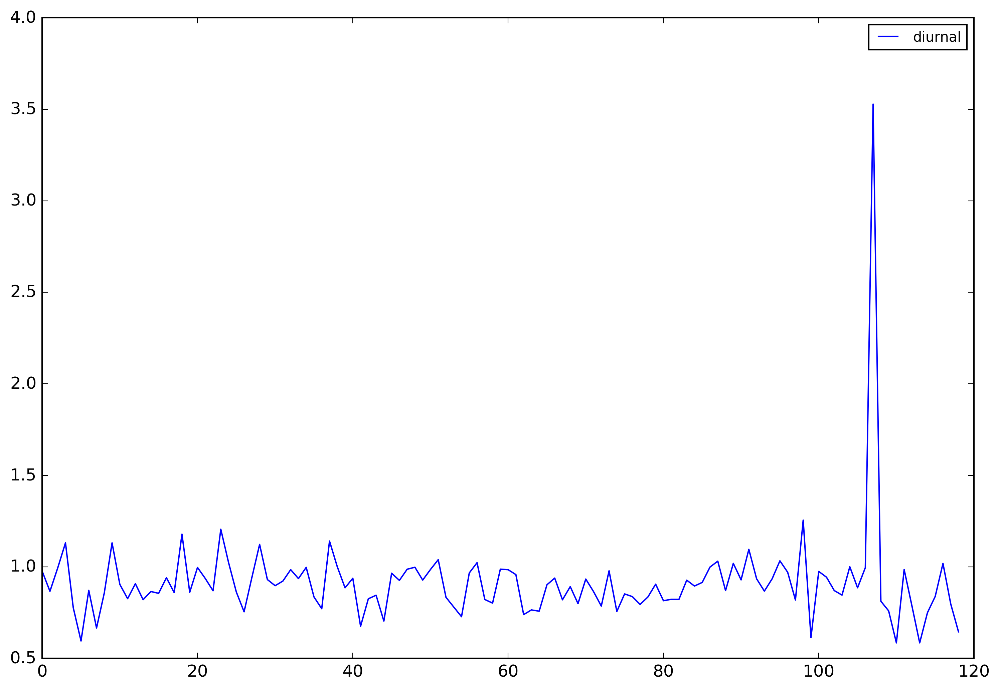

PyObject <matplotlib.legend.Legend object at 0x340c87050>

In [169]:
for GPmodel in keys(all_impt_diagn)
    diagns = all_impt_diagn[GPmodel]
    plt.plot([EVarError(d) for d in diagns], label=GPmodel)
end
plt.legend(loc="upper right", fontsize="small")

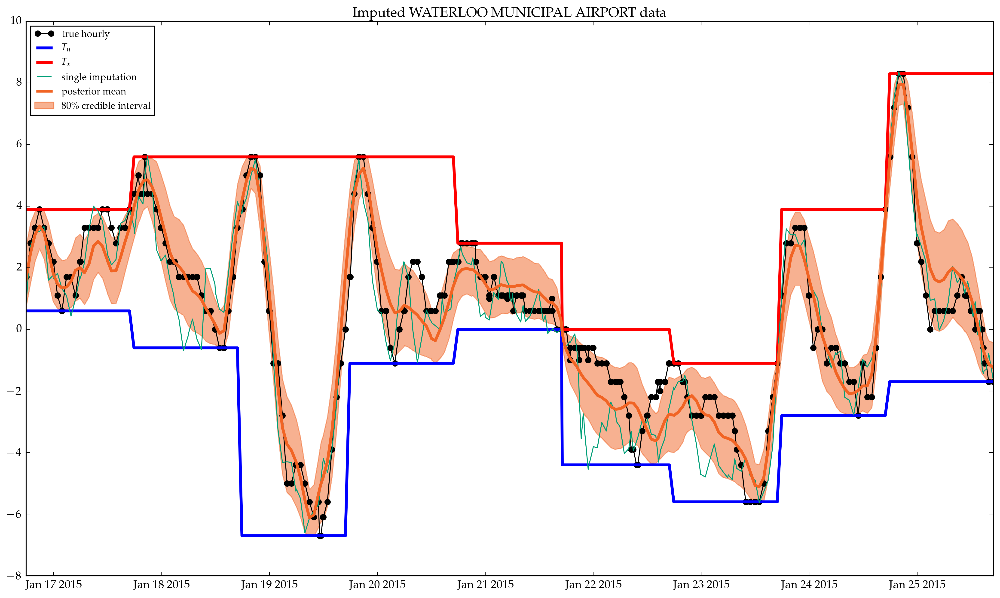

In [51]:
GPModel = "sumprod"
window_num = 6
stan_fw = get_window(window_num)
chains = get_chains(stan_fw, GPModel)
temp_impute = get_temperatures_reparam(chains)
test_subsubset = get_test_fw(test_trimmed, stan_fw)

plot_truth(test_subsubset)
plot_imputations(test_subsubset[:ts].values, temp_impute)

plt.legend(loc="best", fontsize="small")
plt.gcf()[:set_size_inches](18.0, 10.0)
plt.title(@sprintf("Imputed %s data", get(isdSubset[itest,:NAME])))
;

# Aggregating nearby-pred diagnostics

In [88]:
type NearbyPredDiagnostic
    sumEVarError::Float64
    sumVarError::Float64
    n::Int
end

In [108]:
function +(diag1::NearbyPredDiagnostic,diag2::NearbyPredDiagnostic)
    return NearbyPredDiagnostic(
        diag1.sumEVarError + diag2.sumEVarError,
        diag1.sumVarError + diag2.sumVarError,
        diag1.n + diag2.n
        )
end

+ (generic function with 316 methods)

In [53]:
test_windows = [
    FittingWindow(Date(2015,1,1),Date(2015,3,14)),
    FittingWindow(Date(2015,1,25),Date(2015,4,8)),
    FittingWindow(Date(2015,2,18),Date(2015,5,2)),
    FittingWindow(Date(2015,3,14),Date(2015,5,26)),
    FittingWindow(Date(2015,4,8),Date(2015,6,20)),
    FittingWindow(Date(2015,5,2),Date(2015,7,14)),
    FittingWindow(Date(2015,5,26),Date(2015,8,7)),
    FittingWindow(Date(2015,6,20),Date(2015,9,1)),
    FittingWindow(Date(2015,7,14),Date(2015,9,25)),
    FittingWindow(Date(2015,8,7),Date(2015,10,19)),
    FittingWindow(Date(2015,9,1),Date(2015,11,13)),
    FittingWindow(Date(2015,9,25),Date(2015,12,7)),
    FittingWindow(Date(2015,10,19),Date(2015,12,31)),
]

13-element Array{FittingWindow,1}:
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-25,2015-04-08)
 FittingWindow(2015-02-18,2015-05-02)
 FittingWindow(2015-03-14,2015-05-26)
 FittingWindow(2015-04-08,2015-06-20)
 FittingWindow(2015-05-02,2015-07-14)
 FittingWindow(2015-05-26,2015-08-07)
 FittingWindow(2015-06-20,2015-09-01)
 FittingWindow(2015-07-14,2015-09-25)
 FittingWindow(2015-08-07,2015-10-19)
 FittingWindow(2015-09-01,2015-11-13)
 FittingWindow(2015-09-25,2015-12-07)
 FittingWindow(2015-10-19,2015-12-31)

In [56]:
test_windows[3].end_date

2015-05-02

In [70]:
DateTime(2015,5,2,0,0,0) <= Date(2015,5,2)

true

In [73]:
""" 
    Is window A inside of window B?
"""
function a_isinside_b(t::DateTime, b::FittingWindow)
    start_after = t >= b.start_date
    end_before = t <= b.end_date+Day(1)
    return start_after & end_before
end
"""
    How much buffer time is there on either side of the window?
"""
function buffer(t::DateTime, b::FittingWindow)
    start_diff = abs(t - b.start_date)
    end_diff = abs(t - (b.end_date+Day(1)))
    return min(start_diff, end_diff)
end
""" 
    Amongst a list of candidate windows `cand`, find the window that includes `wind`
    with the largest buffer on either sides.
"""
function find_best_window(t::DateTime, cands::Vector{FittingWindow})
    incl_wdows = [fw for fw in cands if a_isinside_b(t, fw)]
    buffers = [buffer(t, fw) for fw in incl_wdows]
    imax = indmax(buffers)
    best_window = incl_wdows[imax]
    return best_window
end

find_best_window

In [80]:
test_ts = hourly_test[:ts].values;

In [81]:
best_pred_window = [find_best_window(t, test_windows) for t in test_ts]
;

In [79]:
best_pred_window

12695-element Array{FittingWindow,1}:
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 ⋮                                   
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWind

In [128]:
A = randn(10,10)

10×10 Array{Float64,2}:
 -1.22272     0.493558  -0.519321  …   0.246583  -0.234098    -0.620178
 -1.40298    -0.636591  -0.497015      0.363762  -1.67431     -0.454789
  0.502215    1.13778   -0.519654      1.02961    0.428073     0.58781 
 -0.0482647   1.1757     0.351813      1.21743    0.552731    -0.814208
 -0.0346714   0.387526   1.84515      -0.638819  -1.10677      0.329941
  0.982324   -0.881427  -0.287209  …  -1.66552    1.8381       0.560264
 -0.249199   -1.68067   -0.968899      0.199189  -0.563846    -0.26829 
 -0.679355   -1.18844    1.14563      -0.83191   -0.711519    -0.981329
  0.353003    0.398243   0.22872      -0.311038  -0.0396633    2.42939 
 -0.665372   -0.280725  -0.8174        1.52932    0.00812631  -0.525356

In [146]:
function get_diagnostics(nearby::TempModel.NearbyPrediction, ts_start::DateTime, ts_end::DateTime; 
                            ndraws=10000)

    test_subset = subset(test_trimmed, ts_start, ts_end, closed_start=true, closed_end=true)
    
    ts = nearby.ts
    iinside = argsubset(ts, ts_start, ts_end)
    ts = ts[iinside]
    μ = nearby.μ[iinside]
    Σ = full(nearby.Σ)[iinside,iinside]
    nobsv = length(μ)
    
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ * centering
    distr = MultivariateNormal(μ, Σ)
    temp_true = test_subset[:temp].values
    n = length(ts)
    return NearbyPredDiagnostic(
        mean(var(μ .- rand(distr)) for _ in 1:ndraws)*n,
        var(μ .- temp_true)*n,
        n
    )
end

get_diagnostics (generic function with 1 method)

In [147]:
all_nearby_diagn = Dict{String, Vector{NearbyPredDiagnostic}}()

Dict{String,Array{NearbyPredDiagnostic,1}} with 0 entries

In [148]:
GPmodel="SExSE"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [149]:
GPmodel="diurnal"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [150]:
GPmodel="fixed_var"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [151]:
GPmodel="free_var"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [152]:
GPmodel="sumprod"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [153]:
collect(keys(all_nearby_diagn))

5-element Array{String,1}:
 "free_var" 
 "sumprod"  
 "SExSE"    
 "fixed_var"
 "diurnal"  

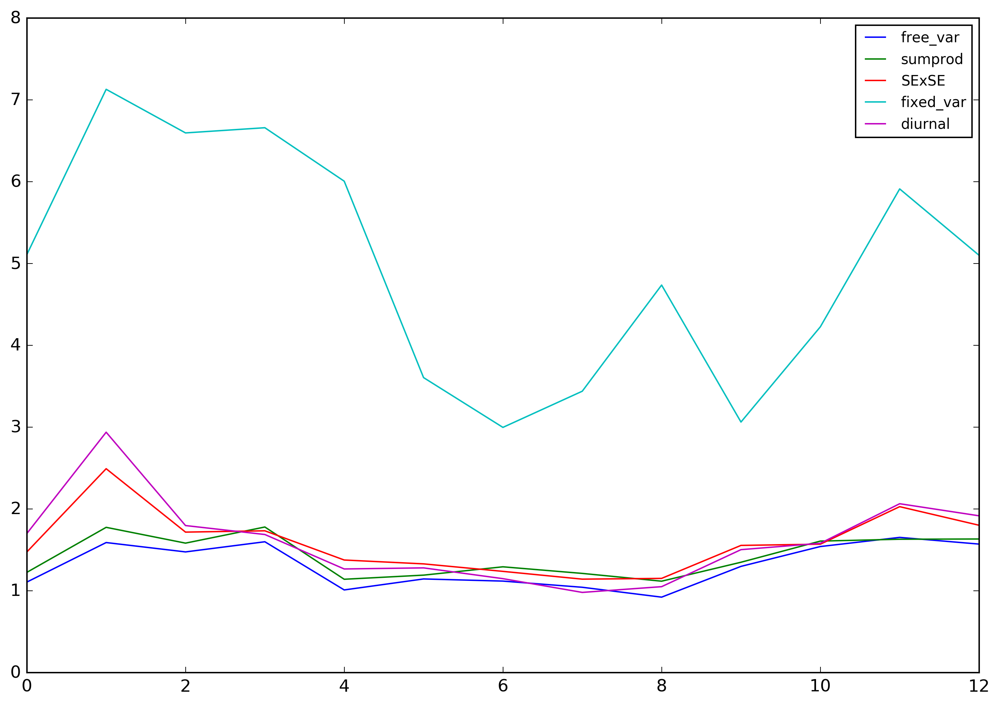

PyObject <matplotlib.legend.Legend object at 0x32ac38350>

In [154]:
for GPmodel in keys(all_nearby_diagn)
    diagns = all_nearby_diagn[GPmodel]
    plt.plot([d.sumVarError/d.n for d in diagns], label=GPmodel)
end
plt.legend(loc="upper right", fontsize="small")

In [155]:
sum(all_nearby_diagn["diurnal"])

NearbyPredDiagnostic(9923.371315565186,20724.932846399202,12695)

In [157]:
@assert sum(all_nearby_diagn["diurnal"]).n == nrow(hourly_test)

In [156]:
for GPmodel in keys(all_nearby_diagn)
    @printf("model: %s\n", GPmodel)
    diagns = all_nearby_diagn[GPmodel]
    sumdiag = sum(diagns)
    @printf("Expected variance:  %.3f\n", sumdiag.sumEVarError/sumdiag.n)
    @printf("Empirical variance: %.3f\n", sumdiag.sumVarError/sumdiag.n)
    print("==========\n")
end

model: free_var
Expected variance:  2.281
Empirical variance: 1.314
model: sumprod
Expected variance:  1.729
Empirical variance: 1.423
model: SExSE
Expected variance:  0.682
Empirical variance: 1.589
model: fixed_var
Expected variance:  8.808
Empirical variance: 4.991
model: diurnal
Expected variance:  0.782
Empirical variance: 1.633
